### 1. Iterative predictions

Write a function to generate synthetic data more meaningful than pure random noise (e.g. a sine function with noise added to it). Choose a covariance function that is sensible for your synthetic data.

Write a program that shows the following steps:

1. Observes a new synthetic datapoint
2. Plots the entire dataset, and 10 samples of the posterior Gaussian Process.
3. Pause for 5 seconds
4. Goto 1 and repeat.

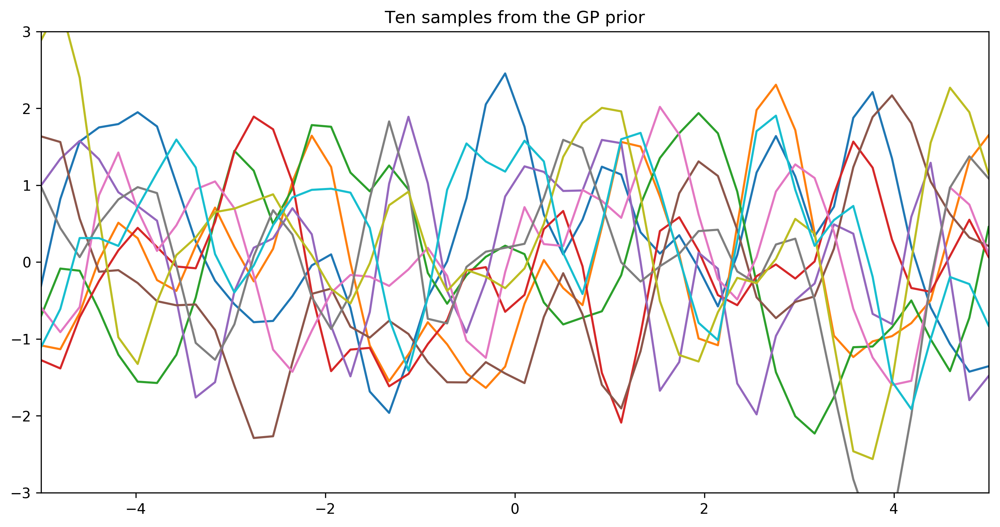

In [50]:
import numpy as np
import matplotlib.pyplot as pl

# Test data
n = 50
Xtest = np.linspace(-5, 5, n).reshape(-1,1)

# Define the kernel function
def kernel(a, b, param):
    sqdist = np.sum(a**2,1).reshape(-1,1) + np.sum(b**2,1) - 2*np.dot(a, b.T)
    return np.exp(-.5 * (1/param) * sqdist)

param = 0.1
K_ss = kernel(Xtest, Xtest, param)

# Get cholesky decomposition (square root) of the
# covariance matrix
L = np.linalg.cholesky(K_ss + 1e-15*np.eye(n))
# Sample 3 sets of standard normals for our test points,
# multiply them by the square root of the covariance matrix
f_prior = np.dot(L, np.random.normal(size=(n,10)))

# Now let's plot the 3 sampled functions.
pl.figure(figsize=(12, 6), dpi=300)
pl.plot(Xtest, f_prior)
pl.axis([-5, 5, -3, 3])
pl.title('Ten samples from the GP prior')
pl.show()

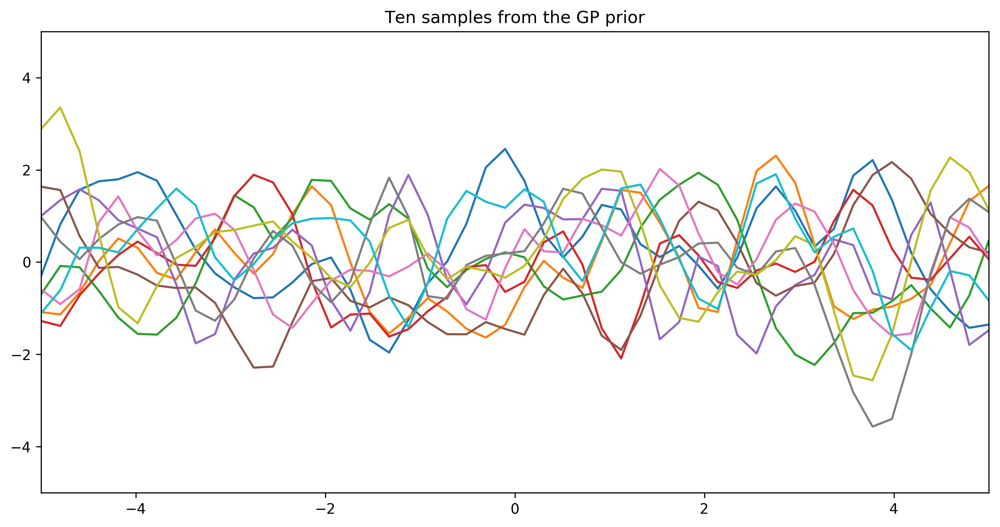

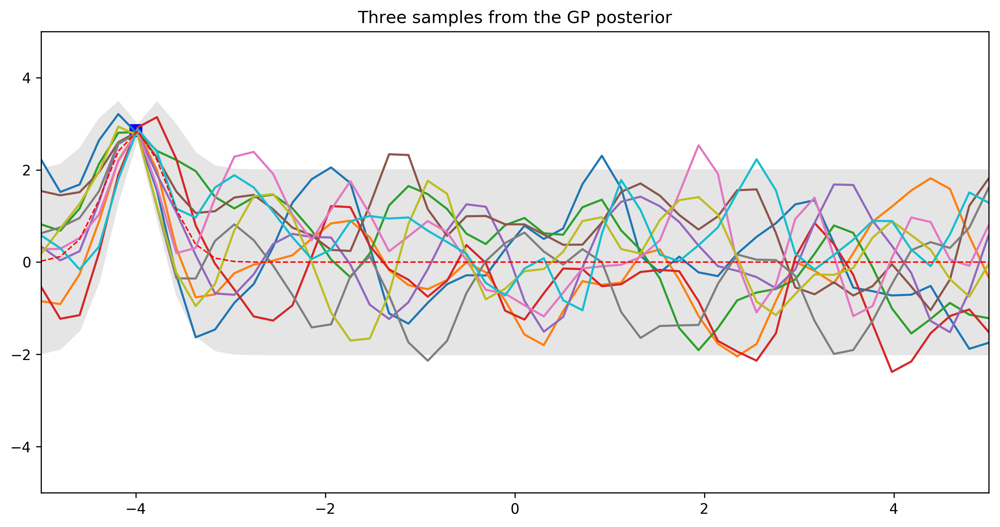

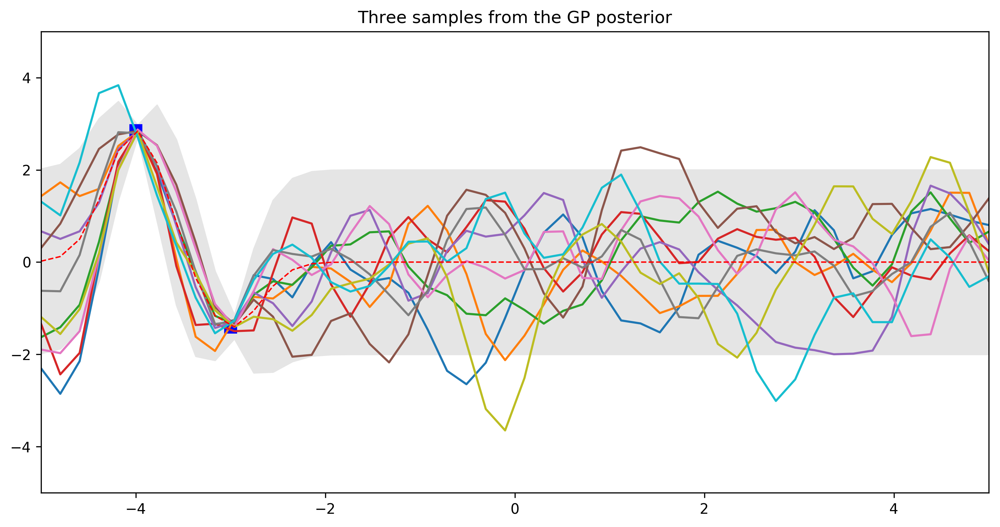

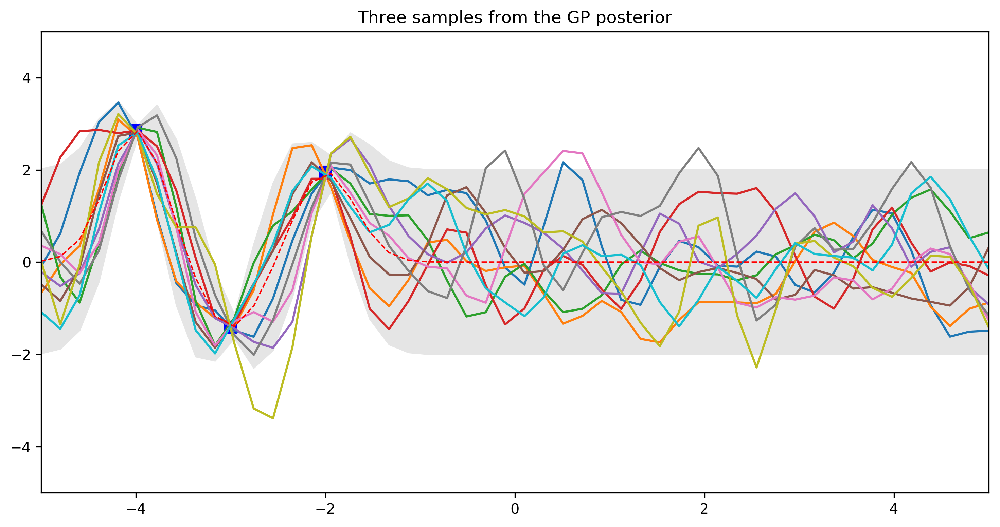

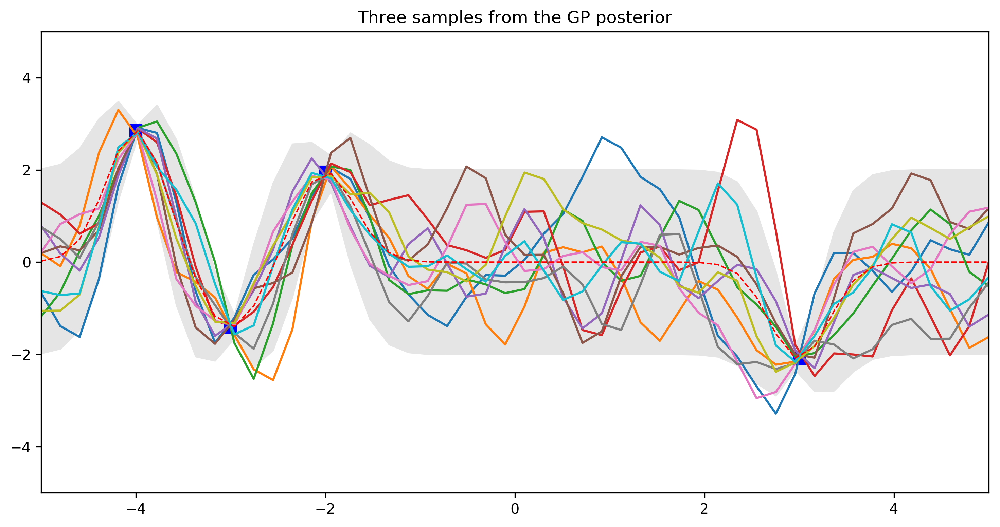

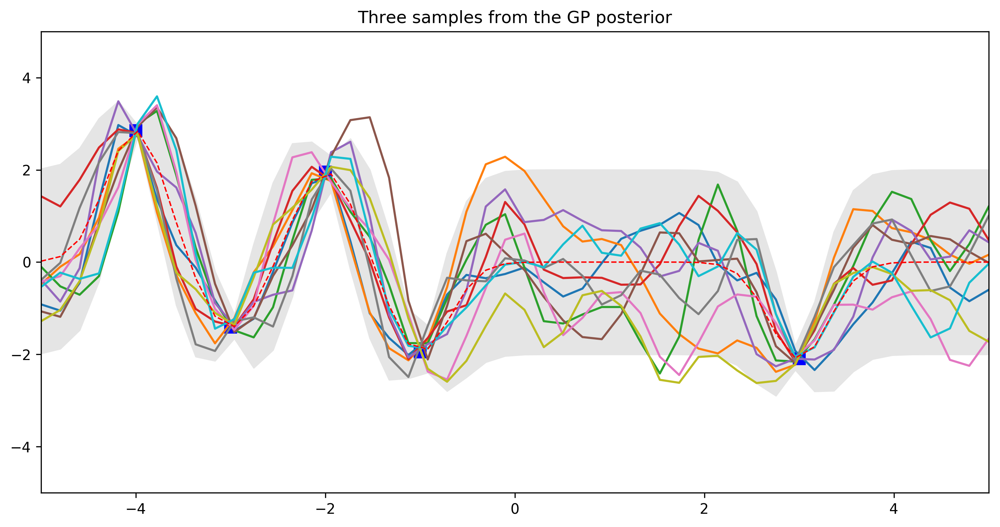

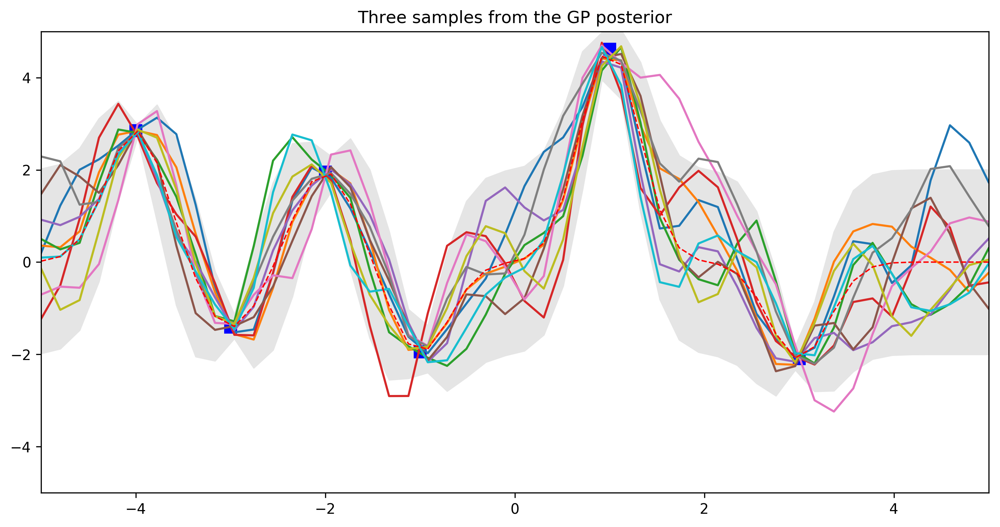

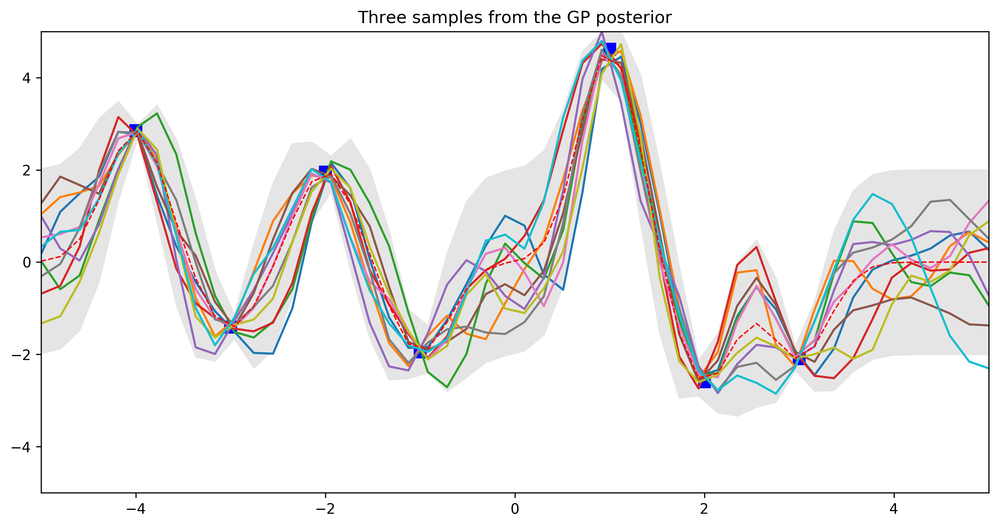

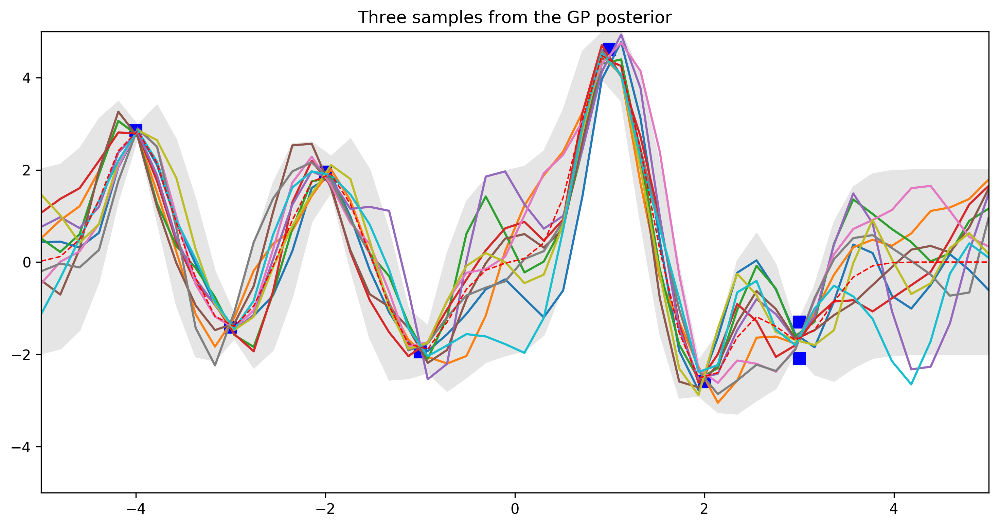

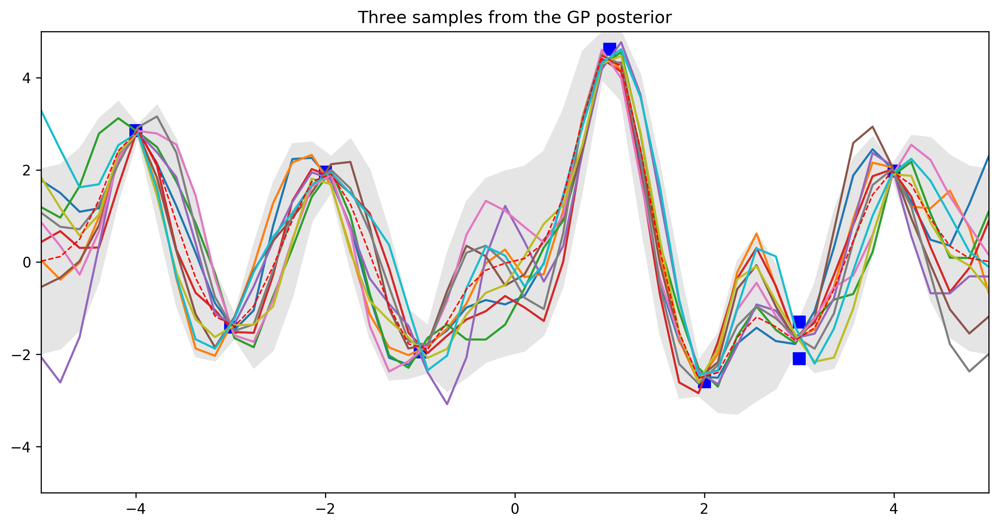

In [58]:
# Noisy training data
Xtrain_full = np.array([-4, -3, -2, 3, -1, 1, 2, 3, 4]).reshape(-1,1)
ytrain_full = np.sin(Xtrain_full) + 2*np.random.normal(size=(len(Xtrain_full),1))

Xtrain = []
ytrain = []

pl.figure(figsize=(12, 6), dpi=300)
pl.plot(Xtest, f_prior)
pl.axis([-5, 5, -5, 5])
pl.title('Ten samples from the GP prior')
pl.show()

for idx in range(len(Xtrain_full)):
    if Xtrain == []:
        Xtrain = Xtrain_full[idx].reshape(1, 1)
        ytrain = ytrain_full[idx].reshape(1, 1)
    else:
        Xtrain = np.vstack([Xtrain, Xtrain_full[idx]])
        ytrain = np.vstack([ytrain, ytrain_full[idx]])
        
    
    
    # Apply the kernel function to our training points
    K = kernel(Xtrain, Xtrain, param)
    L = np.linalg.cholesky(K + 0.00005*np.eye(len(Xtrain)))

    # Compute the mean at our test points.
    K_s = kernel(Xtrain, Xtest, param)
    Lk = np.linalg.solve(L, K_s)
    mu = np.dot(Lk.T, np.linalg.solve(L, ytrain)).reshape((n,))

    # Compute the standard deviation so we can plot it
    s2 = np.diag(K_ss) - np.sum(Lk**2, axis=0)
    stdv = np.sqrt(s2)
    # Draw samples from the posterior at our test points.
    L = np.linalg.cholesky(K_ss + 1e-6*np.eye(n) - np.dot(Lk.T, Lk))
    f_post = mu.reshape(-1,1) + np.dot(L, np.random.normal(size=(n,10)))

    pl.figure(figsize=(12, 6), dpi=300)
    pl.plot(Xtrain, ytrain, 'bs', ms=8)
    pl.plot(Xtest, f_post)
    pl.gca().fill_between(Xtest.flat, mu-2*stdv, mu+2*stdv, color="#e5e5e5")
    pl.plot(Xtest, mu, 'r--', lw=1)
    pl.axis([-5, 5, -5, 5])
    pl.title('Three samples from the GP posterior')
    pl.show()

### 2. CO₂ concentration
A great example of the power of Gaussian Processes is the modeling of the CO₂ concentration in the atmosphere. Using the data as specified here:\ http://learning.eng.cam.ac.uk/carl/mauna/\ Write some python code to fit this data using the GPy library. There are several suggestions for the best covariance function for this dataset available on the internet. A good explanation of one such suggestion is given here: http://scikit-learn.org/stable/auto_examples/gaussian_process/plot_gpr_co2.html, however you are free to choose a simple covariance function and evaluate how good a job it is able to do.

In [121]:
import GPy
GPy.plotting.change_plotting_library('matplotlib')

In [122]:
import numpy as np
import pandas as pd

a = pd.read_csv('9.1 co2_mm_mlo.txt', sep='\s+')
a.head()

,year,month,decimal,average,interpolated,trend,#days
0,1958,3,1958.208,315.71,315.71,314.62,-1
1,1958,4,1958.292,317.45,317.45,315.29,-1
2,1958,5,1958.375,317.50,317.50,314.71,-1
3,1958,6,1958.458,-99.99,317.10,314.85,-1
4,1958,7,1958.542,315.86,315.86,314.98,-1


In [123]:
X_train = np.array(a['decimal']).reshape(-1, 1)
y_train = np.array(a['interpolated']).reshape(-1, 1)

In [134]:
kernel1 = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=41.8)
kernel2 = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=180)
kernel3 = GPy.kern.PeriodicExponential(input_dim=1, variance=1., lengthscale=1.44)
kernel = kernel1 + kernel2 * kernel3

model = GPy.models.GPRegression(X_train, y_train, kernel)

In [131]:
GPy.kern.?

SyntaxError: invalid syntax (<ipython-input-131-021e61fda498>, line 1)

In [125]:
from IPython.display import display
display(model)

GP_regression.,value,constraints,priors
rbf.variance,1.0,+ve,
rbf.lengthscale,1.0,+ve,
Gaussian_noise.variance,1.0,+ve,


AttributeError: 'dict' object has no attribute 'figure'

/usr/local/lib/python3.6/site-packages/matplotlib/figure.py:2366: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



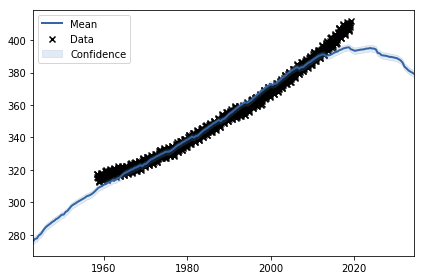

In [135]:
fig = model.plot()
GPy.plotting.show(fig, file_id='hellu')

In [136]:
model.optimize(messages=True)
model.optimize_restarts(num_restarts = 10)

/usr/local/lib/python3.6/site-packages/GPy/kern/src/periodic.py:100: RuntimeWarning:

overflow encountered in true_divide

/usr/local/lib/python3.6/site-packages/GPy/kern/src/periodic.py:86: RuntimeWarning:

overflow encountered in true_divide

/usr/local/lib/python3.6/site-packages/GPy/kern/src/periodic.py:40: RuntimeWarning:

invalid value encountered in multiply

/usr/local/lib/python3.6/site-packages/GPy/kern/src/periodic.py:40: RuntimeWarning:

invalid value encountered in cos

/usr/local/lib/python3.6/site-packages/GPy/kern/src/rbf.py:51: RuntimeWarning:

overflow encountered in square

/usr/local/lib/python3.6/site-packages/GPy/kern/src/stationary.py:168: RuntimeWarning:

overflow encountered in true_divide

/usr/local/lib/python3.6/site-packages/GPy/kern/src/rbf.py:54: RuntimeWarning:

invalid value encountered in multiply

/usr/local/lib/python3.6/site-packages/paramz/transformations.py:111: RuntimeWarning:

overflow encountered in expm1



Optimization restart 1/10, f = 1652.5457332901492
Optimization restart 2/10, f = 957.6504970951548
Optimization restart 3/10, f = 1630.7613924401057
Optimization restart 4/10, f = 1635.0557932031888
Optimization restart 5/10, f = 1693.3408898275454
Optimization restart 6/10, f = 1634.3459947774268
Optimization restart 7/10, f = 1630.7613923180882
Optimization restart 8/10, f = 1913.6360621090842
Optimization restart 9/10, f = 2128.765361248471
Optimization restart 10/10, f = 2432.639637781672


GP_regression.,value,constraints,priors
sum.rbf.variance,19485.998116029026,+ve,
sum.rbf.lengthscale,13.8914640296016,+ve,
sum.mul.rbf.variance,3300.905999750449,+ve,
sum.mul.rbf.lengthscale,2925.0731731616306,+ve,
sum.mul.periodic_exponential.variance,2626.384128529345,+ve,
sum.mul.periodic_exponential.lengthscale,5226.218601447967,+ve,
sum.mul.periodic_exponential.period,9.994312564901126,+ve,
Gaussian_noise.variance,0.502762548841147,+ve,


AttributeError: 'dict' object has no attribute 'figure'

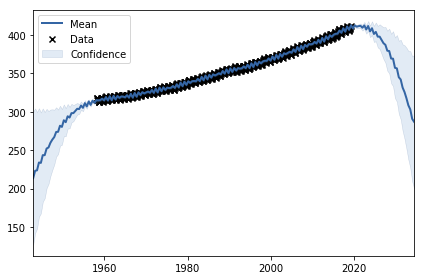

In [142]:
display(model)
fig = model.plot()
GPy.plotting.show(fig)

In [ ]:
gauss1 = {'mean': 10, 'sd': 15}
gauss2 = {'mean': 30, 'sd': 5}

In [103]:
!pip3 install Gpy==1.9.2

    100% |████████████████████████████████| 1.3MB 9.3MB/s 
  Found existing installation: GPy 1.9.6
    Uninstalling GPy-1.9.6:
      Successfully uninstalled GPy-1.9.6
You are using pip version 18.1, however version 19.0.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
